# Data Augmentation

## Important Packages Import:

In [3]:
# Install Alumentation latest version
!pip install -U albumentations

Requirement already up-to-date: albumentations in /usr/local/lib/python3.7/dist-packages (1.0.0)


In [2]:
import albumentations as A
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

In [4]:
# Alumentation latest version
print(A.__version__)

1.0.0


In [6]:
!ls

ISIC_0015719.jpg  ISIC_0096227.jpg  ISIC_0154813.jpg  ISIC_0167093.jpg
ISIC_0052212.jpg  ISIC_0096328.jpg  ISIC_0154870.jpg  ISIC_0168306.jpg
ISIC_0068279.jpg  ISIC_0097499.jpg  ISIC_0154872.jpg  ISIC_0168399.jpg
ISIC_0074268.jpg  ISIC_0097500.jpg  ISIC_0154880.jpg  ISIC_0168418.jpg
ISIC_0074311.jpg  ISIC_0097997.jpg  ISIC_0155012.jpg  ISIC_0168678.jpg
ISIC_0074542.jpg  ISIC_0098198.jpg  ISIC_0155173.jpg  ISIC_0169604.jpg
ISIC_0075663.jpg  ISIC_0098784.jpg  ISIC_0155273.jpg  ISIC_0169687.jpg
ISIC_0075914.jpg  ISIC_0099474.jpg  ISIC_0155473.jpg  ISIC_0170008.jpg
ISIC_0076262.jpg  ISIC_0099546.jpg  ISIC_0155575.jpg  ISIC_0170059.jpg
ISIC_0076545.jpg  ISIC_0100550.jpg  ISIC_0156460.jpg  ISIC_0170101.jpg
ISIC_0076742.jpg  ISIC_0103298.jpg  ISIC_0156642.jpg  ISIC_0170285.jpg
ISIC_0076995.jpg  ISIC_0105145.jpg  ISIC_0156772.jpg  ISIC_0170545.jpg
ISIC_0077472.jpg  ISIC_0106091.jpg  ISIC_0157923.jpg  ISIC_0170583.jpg
ISIC_0077735.jpg  ISIC_0109415.jpg  ISIC_0158127.jpg  ISIC_0170636.jpg
ISIC_0

## Load the files to variable 'images'

In [7]:
images = []
for filename in os.listdir('/content/gdrive/My Drive/sample'):
  img = cv2.imread(os.path.join('/content/gdrive/My Drive/sample',filename))
  if img is not None:
    images.append(img)
    

In [8]:
len(images)

200

## Sample Image details

(4000, 6000, 3)
4000
6000
3


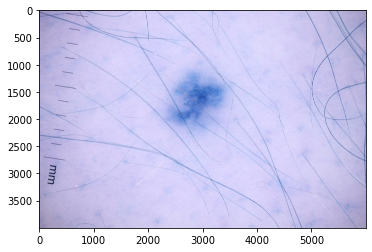

In [9]:
#Print Shape of the sample image
print(images[0].shape)

#Get the width, height and channel values from sample image
w,h,c=images[0].shape

#Print width, height and channel values of sample image
print(w)
print(h)
print(c)

#Show the sample image
plt.imshow(images[0])
plt.show()

## Get the width, height and channel values for all images

In [10]:
#Initialize the empty array for height=h, width=w and channel=c
h=[]
w=[]
c=[]

for i in range(len(images)):
  x,y,z=images[i].shape
  w.append(x)
  h.append(y)
  c.append(z)

## Show the first 10 sample images

Image: 1


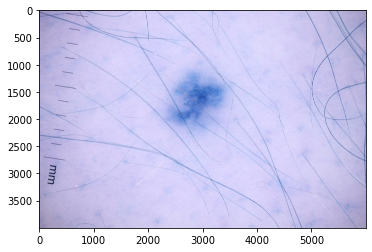

Image: 2


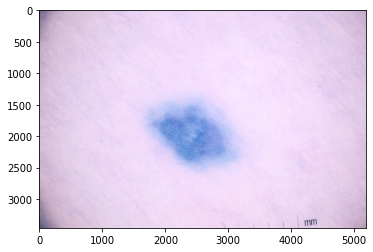

Image: 3


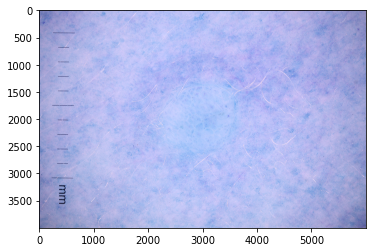

Image: 4


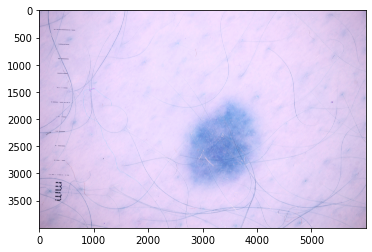

Image: 5


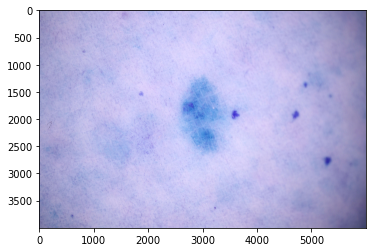

Image: 6


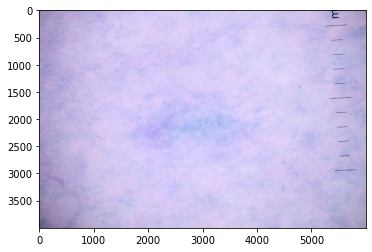

Image: 7


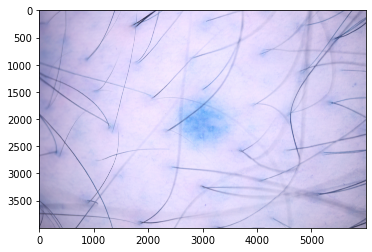

Image: 8


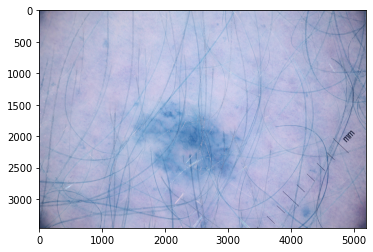

Image: 9


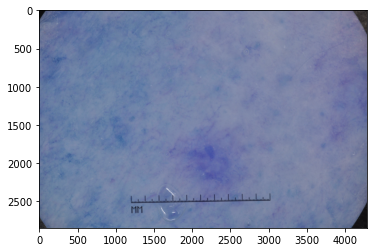

Image: 10


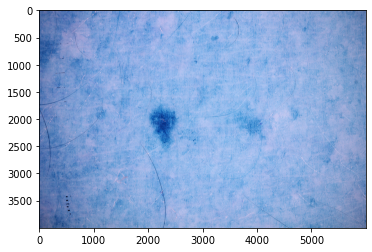

In [11]:
for i in range(10):
  print("Image:",i+1)
  plt.imshow(images[i])
  plt.show()

## Data Augmentations:

### Data Augumentation: With Blurs and Distorsions

In [14]:
transform = A.Compose([
                       A.Transpose(p=0.5),
                       A.VerticalFlip(p=0.5),
                       A.HorizontalFlip(p=0.5),
                       A.Rotate(p=0.5),
                       A.RandomBrightness(limit=0.2, p=0.5),
                       A.RandomContrast(limit=0.2, p=0.5),
                       A.OneOf([
                                A.MotionBlur(blur_limit=5, p=0.25),
                                A.MedianBlur(blur_limit=5, p=0.25),
                                A.GaussianBlur(blur_limit=5, p=0.25),
                                A.GaussNoise(var_limit=(5.0, 30.0), p=0.25)                                
                       ]),
                       A.OneOf([
                                A.OpticalDistortion(distort_limit=1.0, p=0.25),
                                A.GridDistortion(num_steps=5, distort_limit=1., p=0.25),
                                A.ElasticTransform(alpha=3, p=0.25)                               
                       ]),
                       A.CLAHE(clip_limit=4.0, p=0.7),
                       A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=20, val_shift_limit=10, p=0.5),
                       A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, border_mode=0, p=0.85),
                       A.Resize(width=722, height=542, p=0.5),
                       A.Normalize(max_pixel_value=255.0,p=0.5),
                       A.Cutout(max_h_size=int(h[i]*0.1), max_w_size=int(w[i]*0.1), num_holes=8, p=0.7)
                       ])

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:1701: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:1727: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:1852: UserWarning: blur_limit and sigma_limit minimum value can not be both equal to 0. blur_limit minimum value changed to 3.
  "blur_limit and sigma_limit minimum value can not be both equal to 0. "
/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:645: FutureWarning: This class has been deprecated. Please use CoarseDropout
  FutureWarning,


### Data Augumentation: Without Blurs and Distorsions

In [15]:
transform1 = A.Compose([
                        A.Transpose(p=0.5),
                        A.Flip(p=0.5),
                        A.OneOf([
                                 A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),
                                 A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1)
                                 ],p=1),
                        A.GaussianBlur(p=0.05),
                        A.HueSaturationValue(p=0.5),
                        A.RGBShift(p=0.5),
                        ])

### Augmentation of first 50 images images with the 2 augmentations

Sample Image 1:


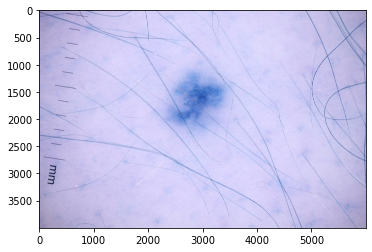

Augmentated Image with Blur and distorsion 1:


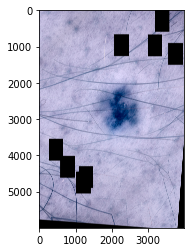

Augmentated Image without Blur and distorsion 1:


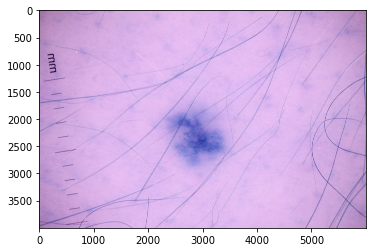

Sample Image 2:


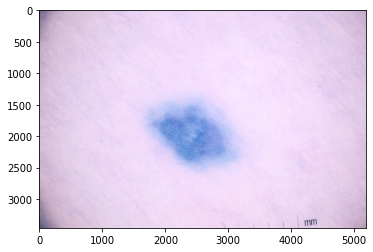

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 2:


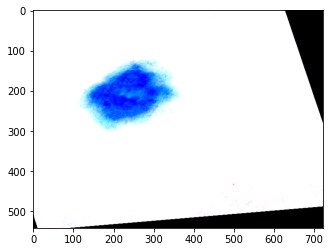

Augmentated Image without Blur and distorsion 2:


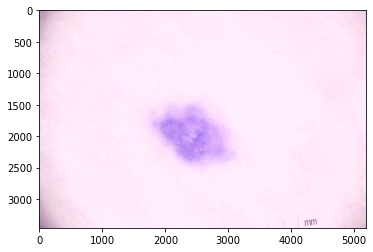

Sample Image 3:


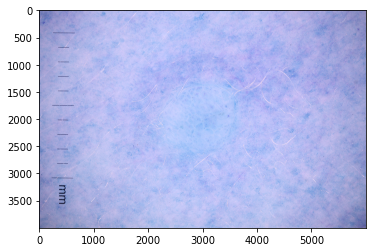

Augmentated Image with Blur and distorsion 3:


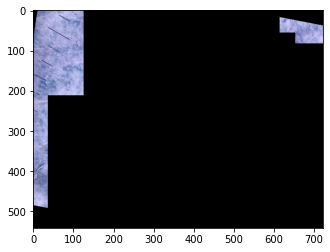

Augmentated Image without Blur and distorsion 3:


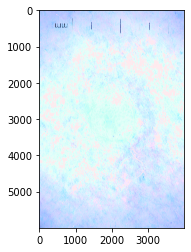

Sample Image 4:


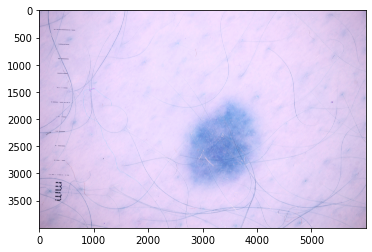

Augmentated Image with Blur and distorsion 4:


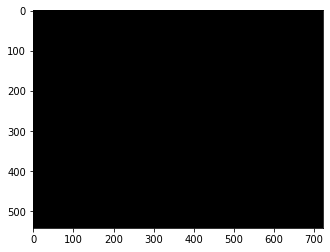

Augmentated Image without Blur and distorsion 4:


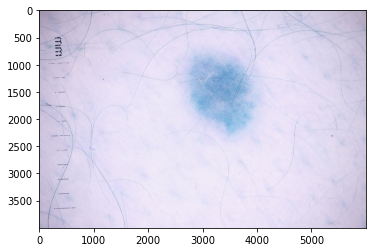

Sample Image 5:


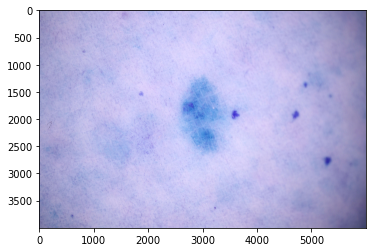

Augmentated Image with Blur and distorsion 5:


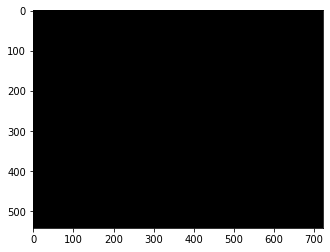

Augmentated Image without Blur and distorsion 5:


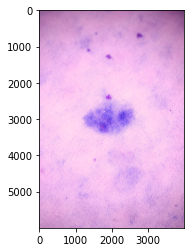

Sample Image 6:


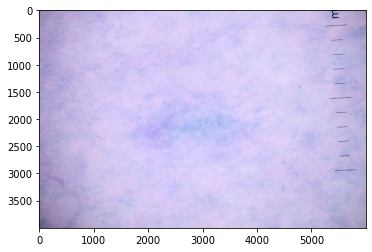

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 6:


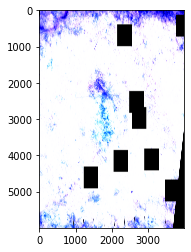

Augmentated Image without Blur and distorsion 6:


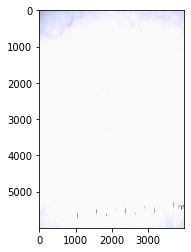

Sample Image 7:


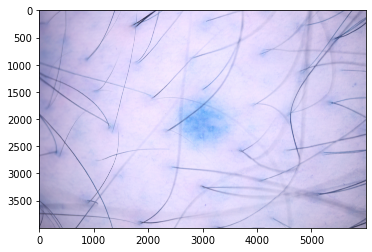

Augmentated Image with Blur and distorsion 7:


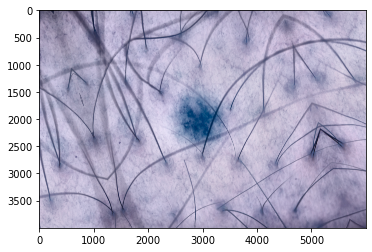

Augmentated Image without Blur and distorsion 7:


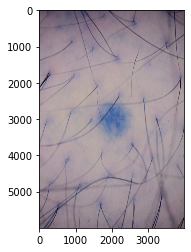

Sample Image 8:


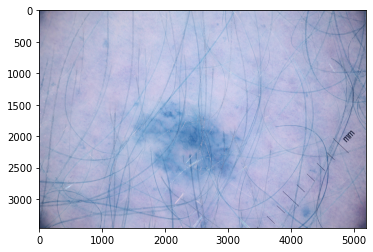

Augmentated Image with Blur and distorsion 8:


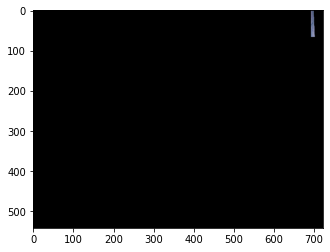

Augmentated Image without Blur and distorsion 8:


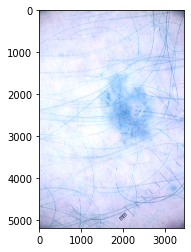

Sample Image 9:


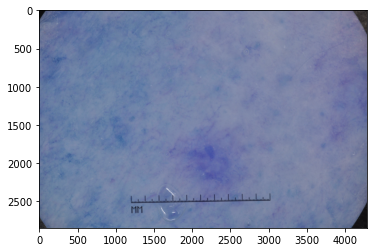

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 9:


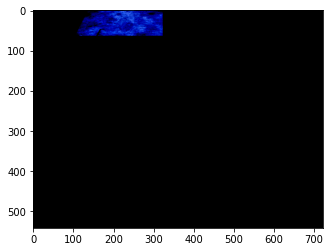

Augmentated Image without Blur and distorsion 9:


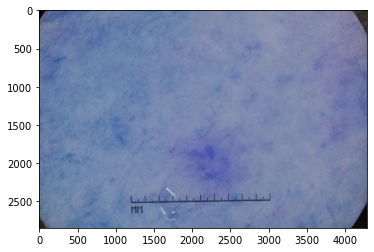

Sample Image 10:


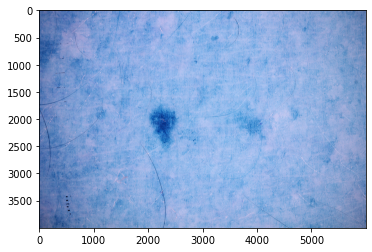

Augmentated Image with Blur and distorsion 10:


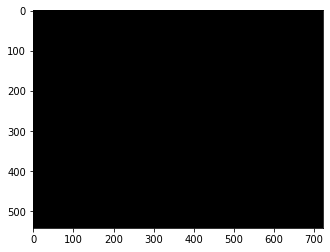

Augmentated Image without Blur and distorsion 10:


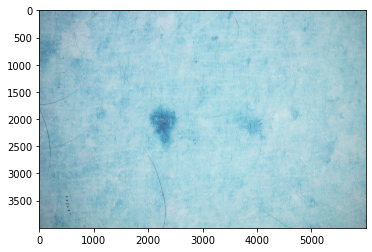

Sample Image 11:


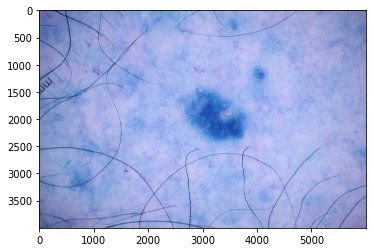

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 11:


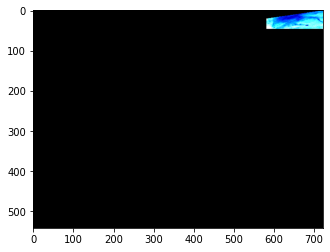

Augmentated Image without Blur and distorsion 11:


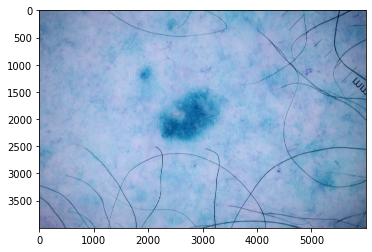

Sample Image 12:


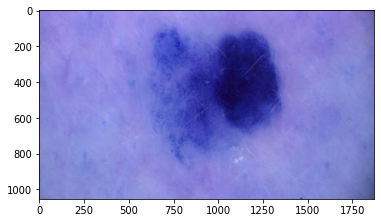

Augmentated Image with Blur and distorsion 12:


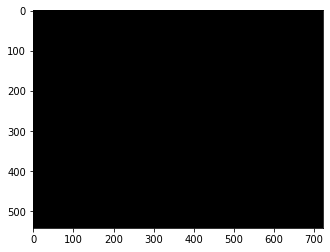

Augmentated Image without Blur and distorsion 12:


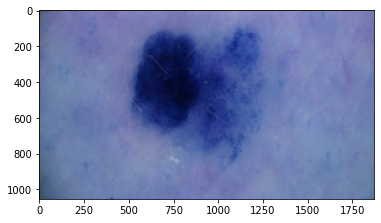

Sample Image 13:


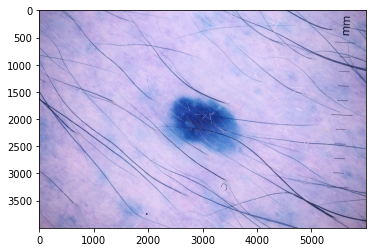

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 13:


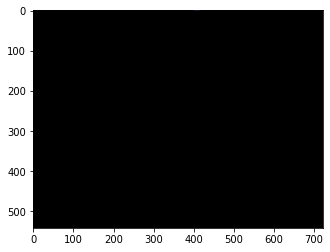

Augmentated Image without Blur and distorsion 13:


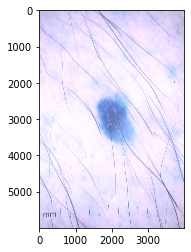

Sample Image 14:


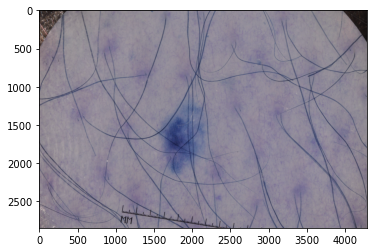

Augmentated Image with Blur and distorsion 14:


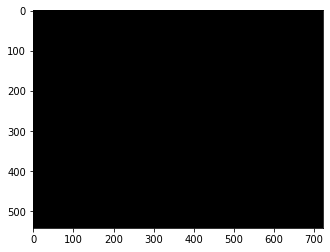

Augmentated Image without Blur and distorsion 14:


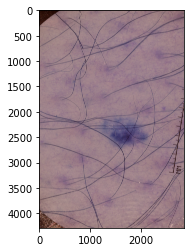

Sample Image 15:


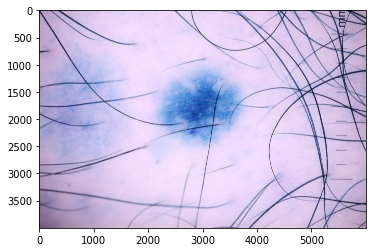

Augmentated Image with Blur and distorsion 15:


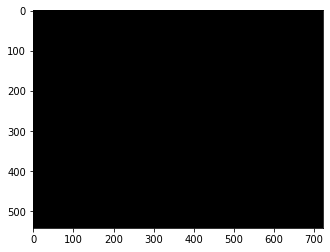

Augmentated Image without Blur and distorsion 15:


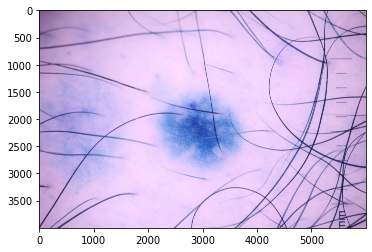

Sample Image 16:


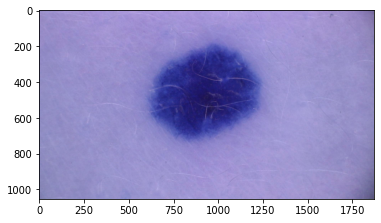

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 16:


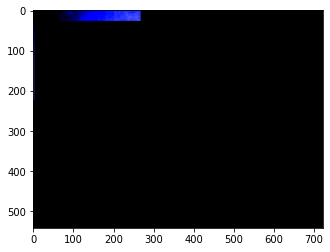

Augmentated Image without Blur and distorsion 16:


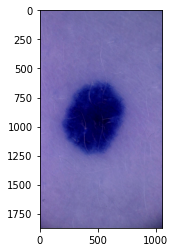

Sample Image 17:


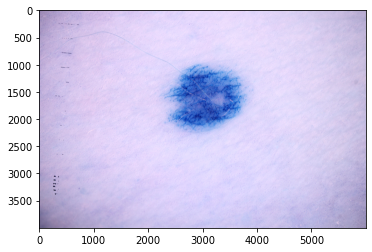

Augmentated Image with Blur and distorsion 17:


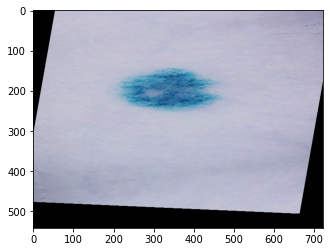

Augmentated Image without Blur and distorsion 17:


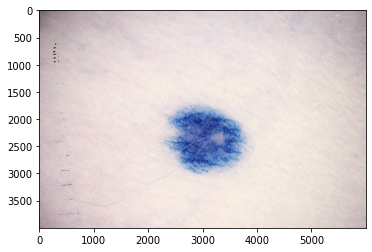

Sample Image 18:


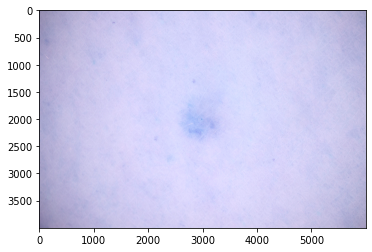

Augmentated Image with Blur and distorsion 18:


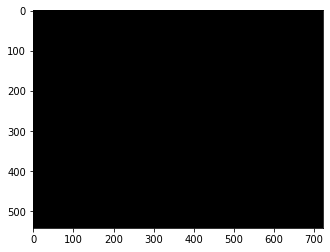

Augmentated Image without Blur and distorsion 18:


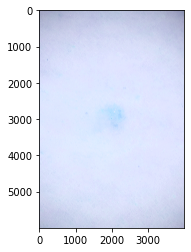

Sample Image 19:


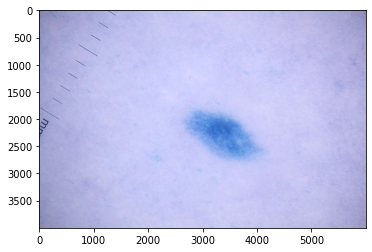

Augmentated Image with Blur and distorsion 19:


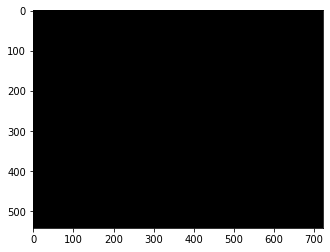

Augmentated Image without Blur and distorsion 19:


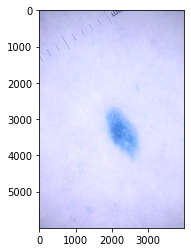

Sample Image 20:


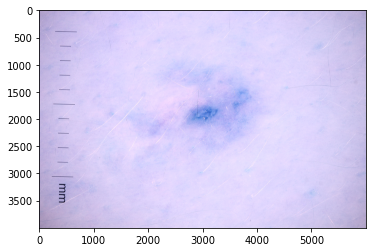

Augmentated Image with Blur and distorsion 20:


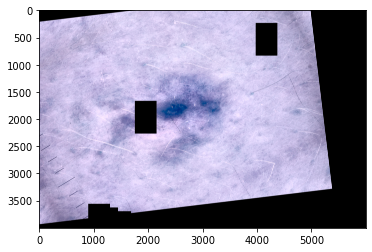

Augmentated Image without Blur and distorsion 20:


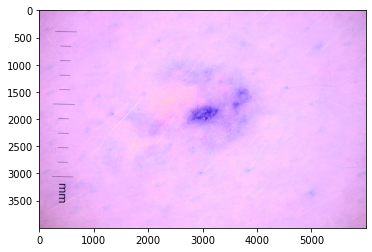

Sample Image 21:


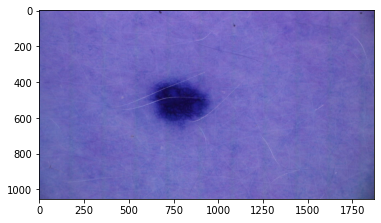

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 21:


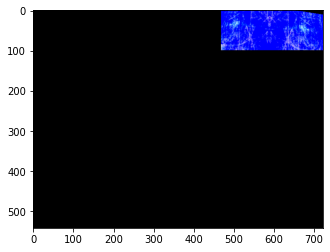

Augmentated Image without Blur and distorsion 21:


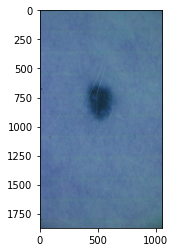

Sample Image 22:


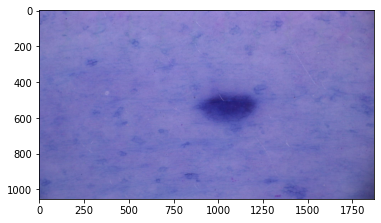

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 22:


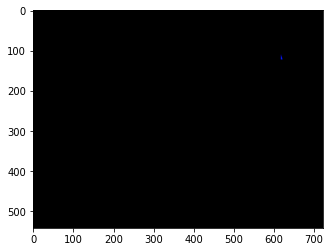

Augmentated Image without Blur and distorsion 22:


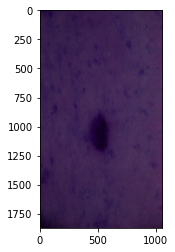

Sample Image 23:


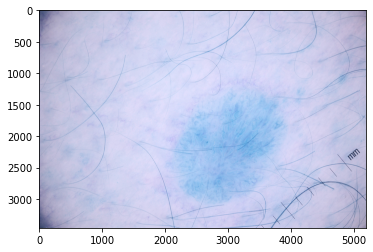

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 23:


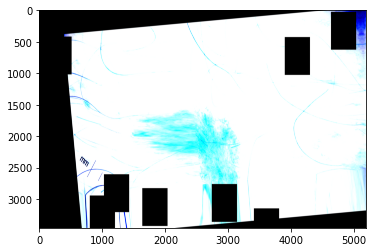

Augmentated Image without Blur and distorsion 23:


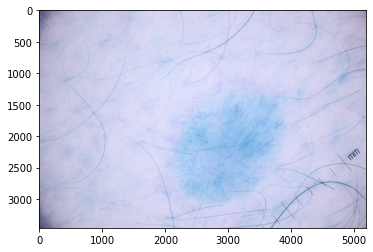

Sample Image 24:


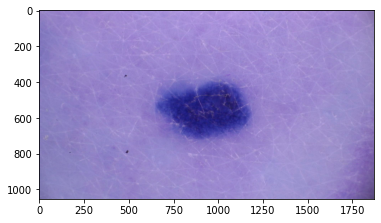

Augmentated Image with Blur and distorsion 24:


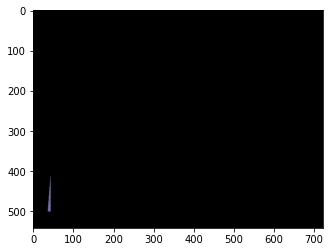

Augmentated Image without Blur and distorsion 24:


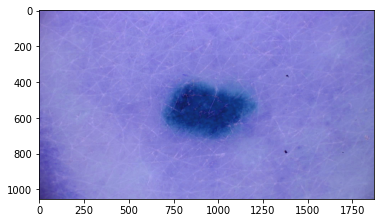

Sample Image 25:


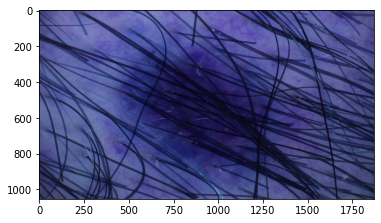

Augmentated Image with Blur and distorsion 25:


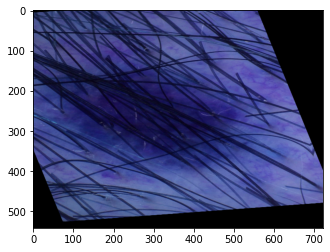

Augmentated Image without Blur and distorsion 25:


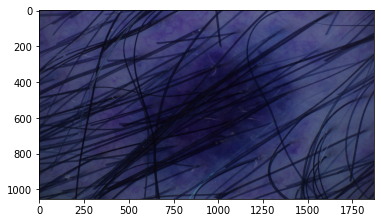

Sample Image 26:


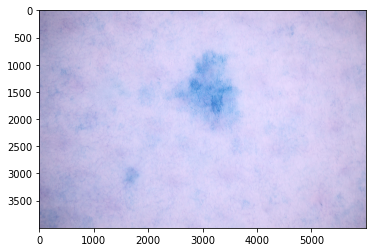

Augmentated Image with Blur and distorsion 26:


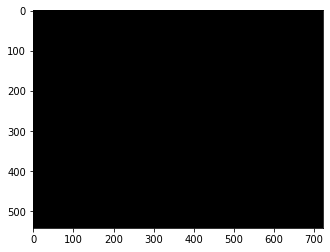

Augmentated Image without Blur and distorsion 26:


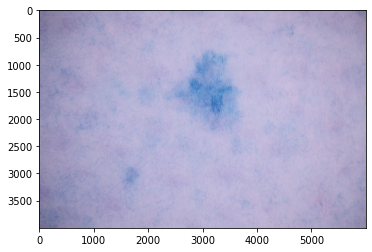

Sample Image 27:


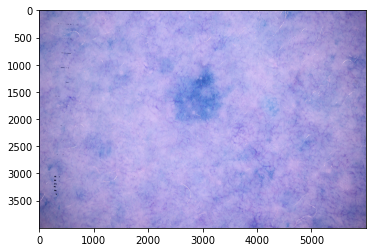

Augmentated Image with Blur and distorsion 27:


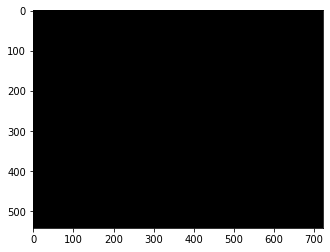

Augmentated Image without Blur and distorsion 27:


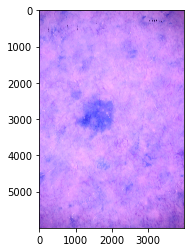

Sample Image 28:


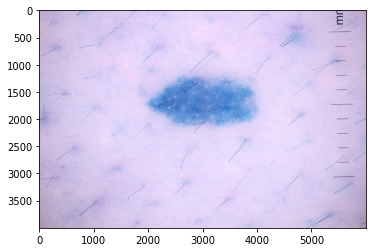

Augmentated Image with Blur and distorsion 28:


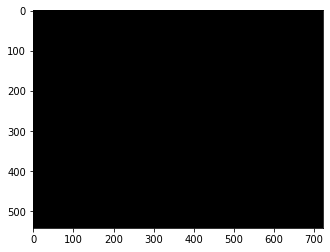

Augmentated Image without Blur and distorsion 28:


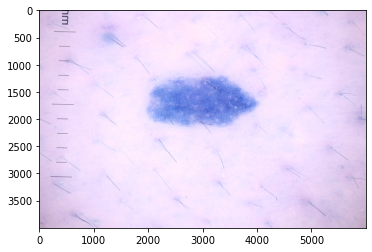

Sample Image 29:


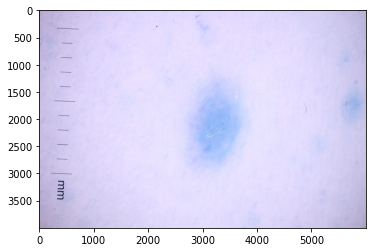

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 29:


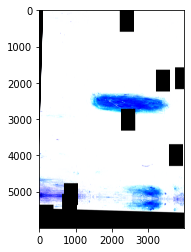

Augmentated Image without Blur and distorsion 29:


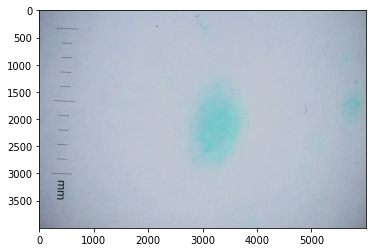

Sample Image 30:


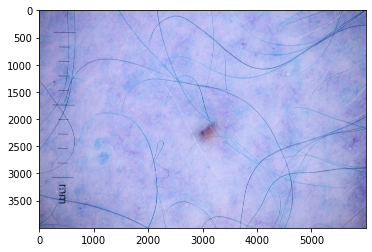

Augmentated Image with Blur and distorsion 30:


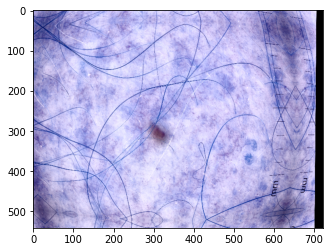

Augmentated Image without Blur and distorsion 30:


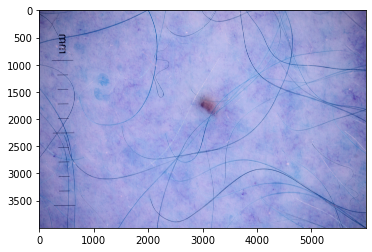

Sample Image 31:


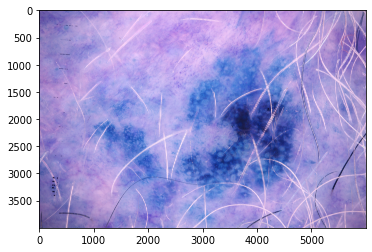

Augmentated Image with Blur and distorsion 31:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


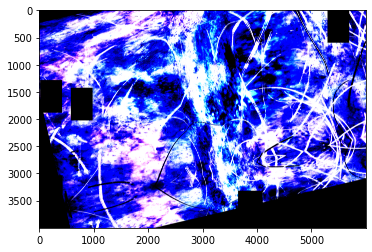

Augmentated Image without Blur and distorsion 31:


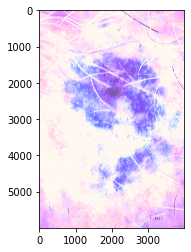

Sample Image 32:


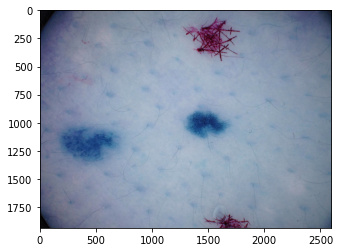

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 32:


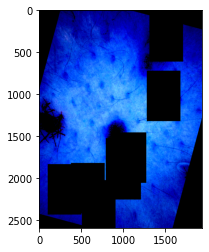

Augmentated Image without Blur and distorsion 32:


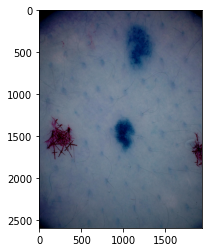

Sample Image 33:


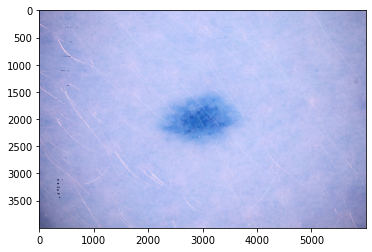

Augmentated Image with Blur and distorsion 33:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


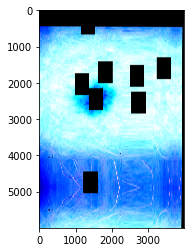

Augmentated Image without Blur and distorsion 33:


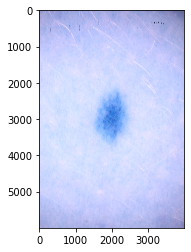

Sample Image 34:


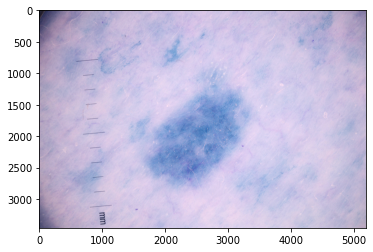

Augmentated Image with Blur and distorsion 34:


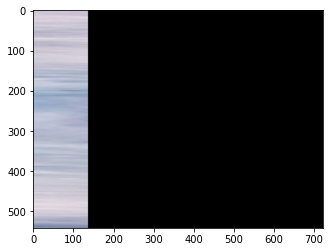

Augmentated Image without Blur and distorsion 34:


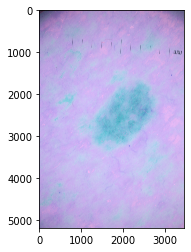

Sample Image 35:


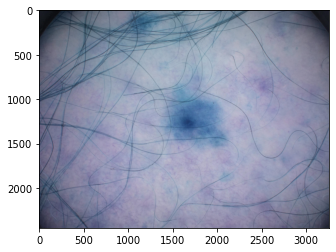

Augmentated Image with Blur and distorsion 35:


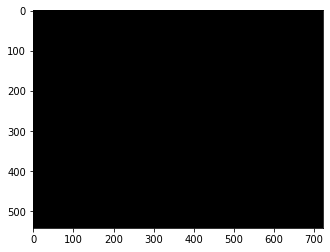

Augmentated Image without Blur and distorsion 35:


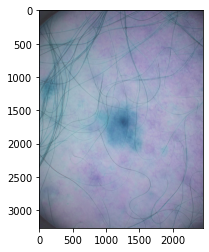

Sample Image 36:


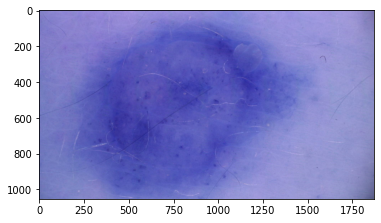

Augmentated Image with Blur and distorsion 36:


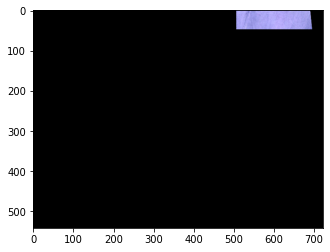

Augmentated Image without Blur and distorsion 36:


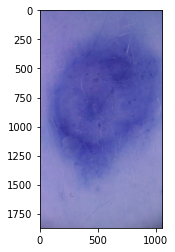

Sample Image 37:


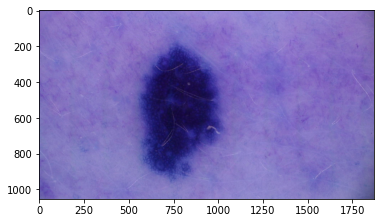

Augmentated Image with Blur and distorsion 37:


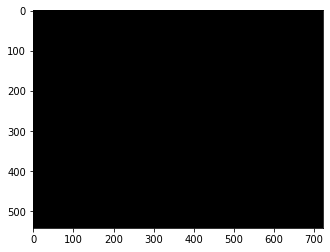

Augmentated Image without Blur and distorsion 37:


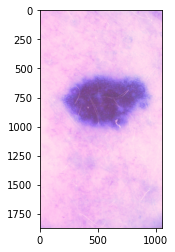

Sample Image 38:


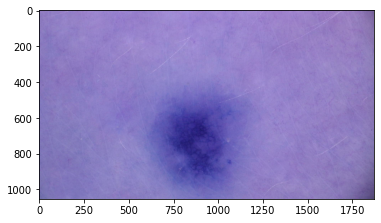

Augmentated Image with Blur and distorsion 38:


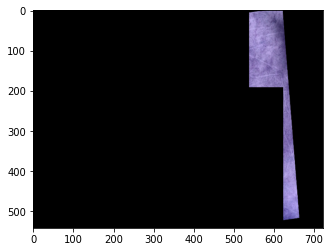

Augmentated Image without Blur and distorsion 38:


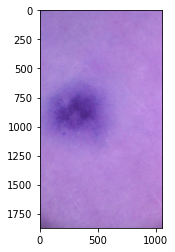

Sample Image 39:


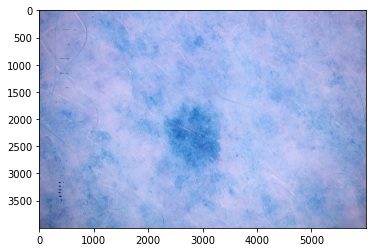

Augmentated Image with Blur and distorsion 39:


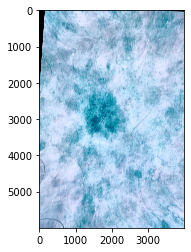

Augmentated Image without Blur and distorsion 39:


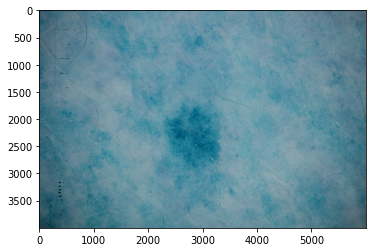

Sample Image 40:


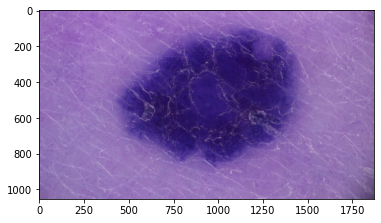

Augmentated Image with Blur and distorsion 40:


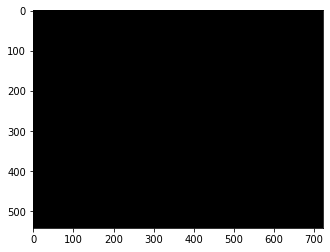

Augmentated Image without Blur and distorsion 40:


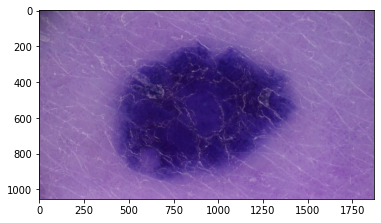

Sample Image 41:


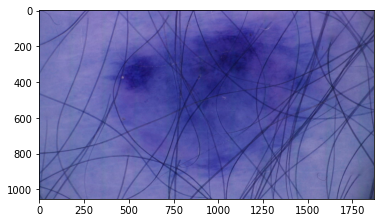

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 41:


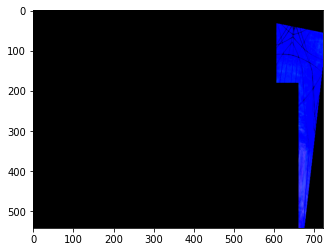

Augmentated Image without Blur and distorsion 41:


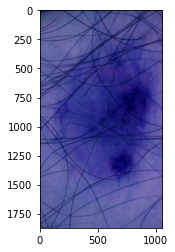

Sample Image 42:


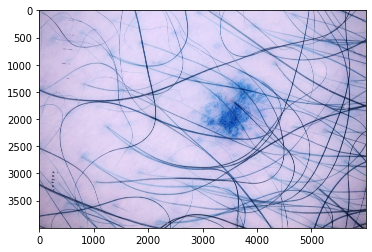

Augmentated Image with Blur and distorsion 42:


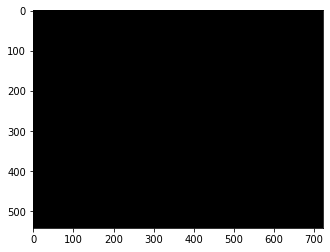

Augmentated Image without Blur and distorsion 42:


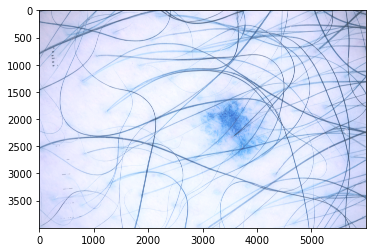

Sample Image 43:


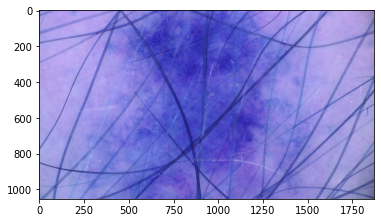

Augmentated Image with Blur and distorsion 43:


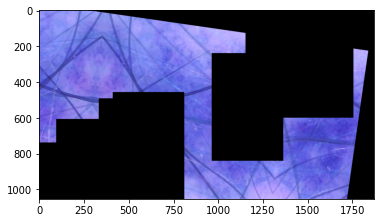

Augmentated Image without Blur and distorsion 43:


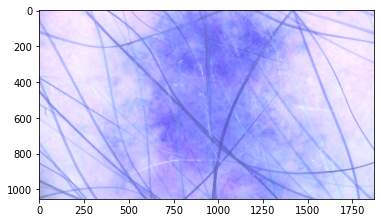

Sample Image 44:


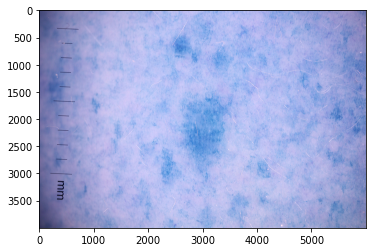

Augmentated Image with Blur and distorsion 44:


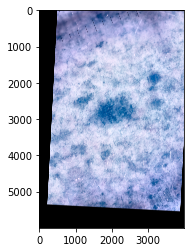

Augmentated Image without Blur and distorsion 44:


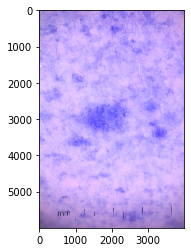

Sample Image 45:


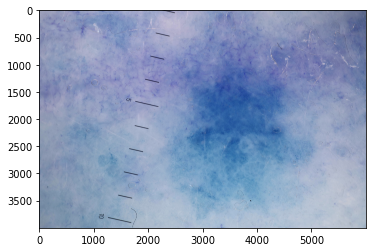

Augmentated Image with Blur and distorsion 45:


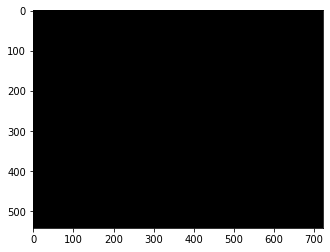

Augmentated Image without Blur and distorsion 45:


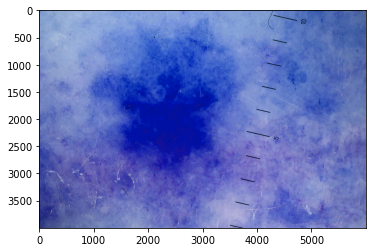

Sample Image 46:


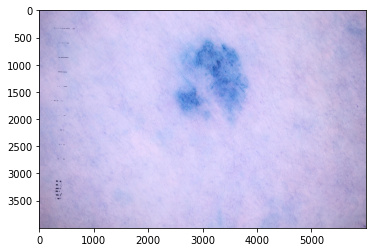

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 46:


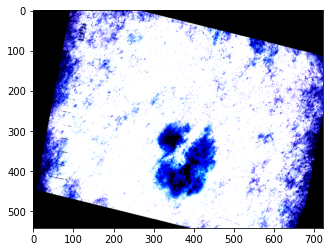

Augmentated Image without Blur and distorsion 46:


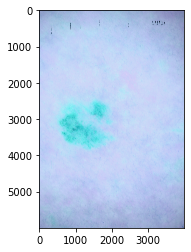

Sample Image 47:


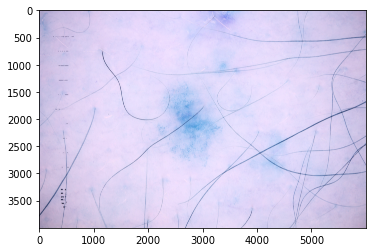

Augmentated Image with Blur and distorsion 47:


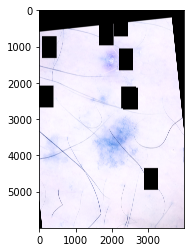

Augmentated Image without Blur and distorsion 47:


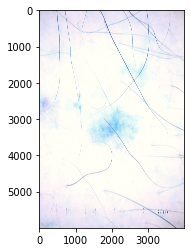

Sample Image 48:


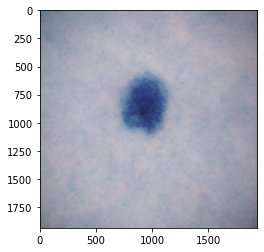

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Augmentated Image with Blur and distorsion 48:


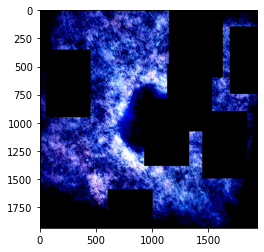

Augmentated Image without Blur and distorsion 48:


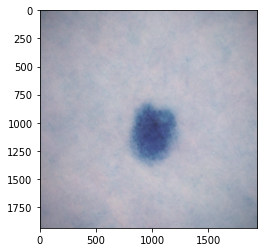

Sample Image 49:


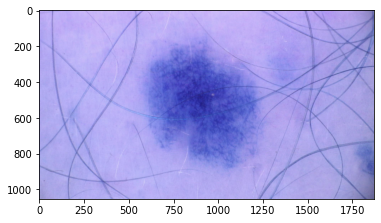

Augmentated Image with Blur and distorsion 49:


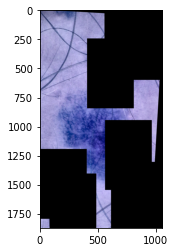

Augmentated Image without Blur and distorsion 49:


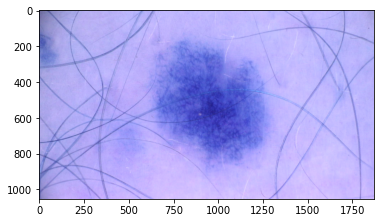

Sample Image 50:


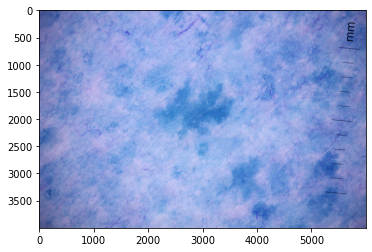

Augmentated Image with Blur and distorsion 50:


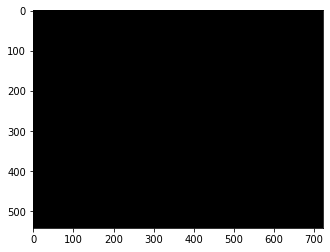

Augmentated Image without Blur and distorsion 50:


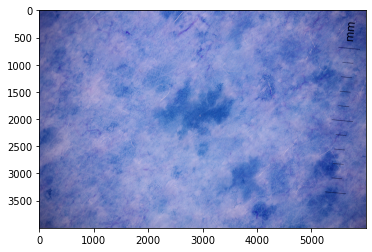

In [19]:
for i in range(50):
  #with Blur and distorsion
  transformed = transform(image=images[i])
  transformed_image = transformed["image"]
  
  #without Blur and distorsion
  transformed1 = transform1(image=images[i])
  transformed_image1 = transformed1["image"]
  
  print('Sample Image {}:'.format(i+1))
  plt.imshow(images[i])
  plt.show()
  
  print('Augmentated Image with Blur and distorsion {}:'.format(i+1))
  plt.imshow(transformed_image)
  plt.show()

  print('Augmentated Image without Blur and distorsion {}:'.format(i+1))
  plt.imshow(transformed_image1)
  plt.show()